In [1]:
import numpy as np
import pandas as pd

from utils import validate, package_run_data, package_calib_data, circdist, circmedian
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import arviz as az
import colorsys

#NP set random seed
np.random.seed(42)

az.style.use("arviz-docgrid")

## Loading data

In [2]:
experiment_orientations = [159, 123, 87, 51, 15]
subjects = ["01", "02", "03", "04", "05", "06", "07", "08" ,"09", "10", "11", "12", "14"]
median_key = {15:0, 51:1, 87:2, 123:3, 159:4}
std_key = {15:0, 51:1, 87:2, 123:3, 159:4}

In [3]:
# Allow negative angles
c_table, med, std, ctimetable = package_calib_data(do_clip=False)
r_table, (x, y, d, r, e) = package_run_data(med, std, do_clip=False, do_noise_thresh=False)

Loading data:  63%|██████▎   | 33/52 [00:00<00:00, 323.45it/s]

Loading data: 100%|██████████| 312/312 [00:00<00:00, 318.50it/s]


## Data Shaping

In [4]:
xaxis = np.arange(-250, 750, 1) * (1000/120)
start_idx, end_idx = np.searchsorted(xaxis, -500), np.searchsorted(xaxis, 1500)
(start_idx, end_idx)

(191, 430)

In [5]:
# Give me index of nan values
# np.argwhere(np.isnan(ds))

# Moake those nan values 0
# ds[np.isnan(ds)] = 0
# ds[np.isnan(er)] = 90

# drop nan rows
# ds = ds[~np.isnan(ds).any(axis=1)]
# ds.shape

In [6]:
# Excluding subject 8
# all execpt index 7.

# data_mask = r_table["subj"] != 7

In [7]:
# our frmes of intrest are only
er = e[10, :, :, :, start_idx:end_idx].reshape(-1, 239)

# ds
ds = d[10, :, :, :, start_idx:end_idx].reshape(-1, 239)

# er = er[data_mask]
# ds = ds[data_mask]

ds[np.isnan(ds)] = 0
er[np.isnan(er)] = 90

er.shape, np.isnan(er).any(), ds.shape, np.isnan(ds).any()

((2880, 239), False, (2880, 239), False)

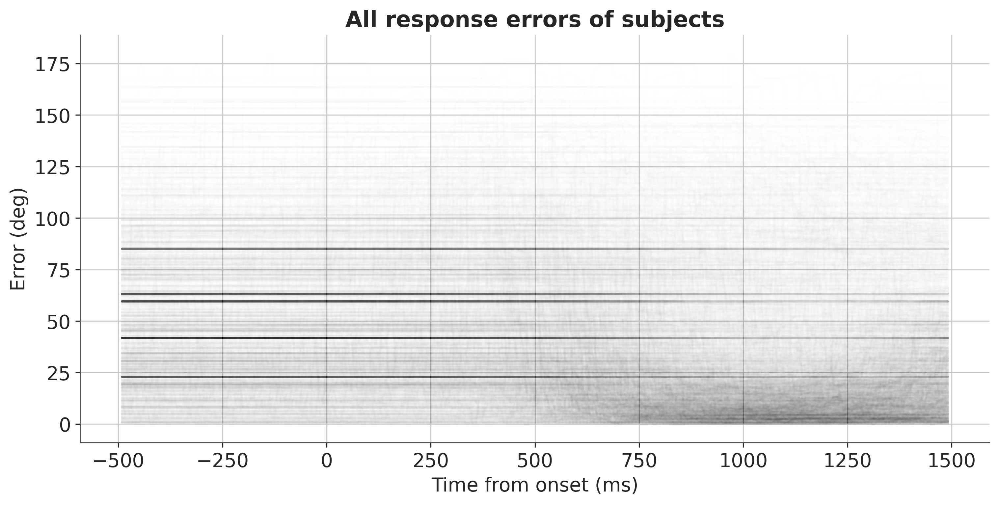

In [8]:
# lets see the responses
mini_axis = xaxis[start_idx:end_idx]

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
for line in er.reshape(-1, 239):
    ax.plot(mini_axis, line, "k-", alpha=0.005)

ax.set_xlabel("Time from onset (ms)")
ax.set_ylabel("Error (deg)")
ax.set_title("All response errors of subjects")

plt.show()

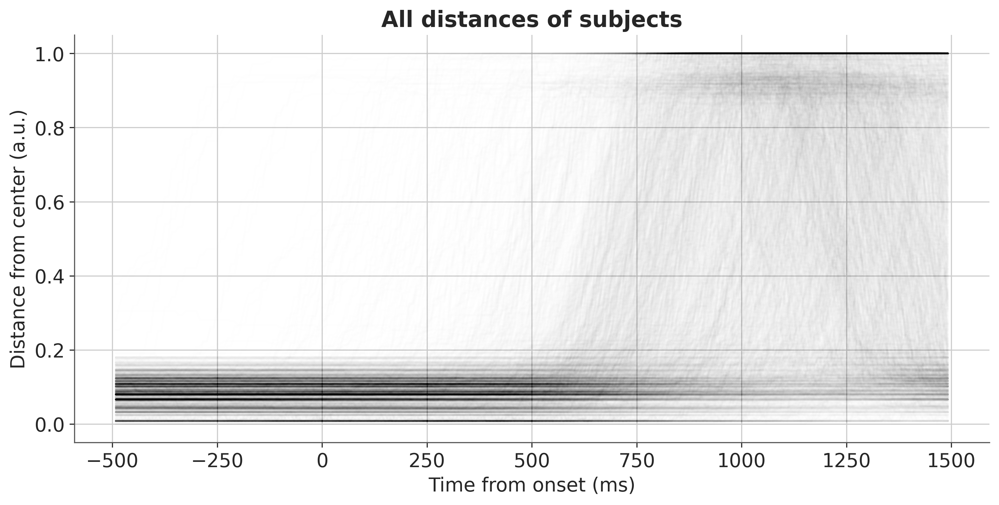

In [9]:
# lets see the responses
mini_axis = xaxis[start_idx:end_idx]

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
for line in ds.reshape(-1, 239):
    ax.plot(mini_axis, line, "k-", alpha=0.005)

ax.set_xlabel("Time from onset (ms)")
ax.set_ylabel("Distance from center (a.u.)")
ax.set_title("All distances of subjects")

plt.show()

## HMMS

In [10]:
# Math imports
import math
from functools import partial
from itertools import count
import numpy as np
from scipy.stats import norm, poisson, expon, uniform, binom, beta, halfnorm
import jax.numpy as jnp
import jax.random as jr
from jax import vmap
import optax

from dynamax.hidden_markov_model import GaussianHMM, DiagonalGaussianHMM, LinearRegressionHMM
from dynamax.utils.utils import find_permutation

In [11]:
from jax.lib import xla_bridge
print(xla_bridge.get_backend().platform)

gpu


In [12]:
ds.shape, er.shape

((2880, 239), (2880, 239))

In [13]:
# min max scale err
er = er / 180
# ds = ds * 180

In [14]:
# train_emissions = jnp.array(er.reshape(2880, 239, 1))
# train_emissions = jnp.array(ds.reshape(2880, 239, 1))
train_emissions = jnp.array(np.stack([ds, er], axis=-1))
train_emissions.shape

(2880, 239, 2)

### Crossval

In [15]:
crossval_subset = np.random.choice(np.arange(0, 2880), 50, replace=False)
crossval_emissions = train_emissions[crossval_subset]
crossval_emissions

Array([[[0.07976867, 0.16157402],
        [0.07976867, 0.16157402],
        [0.07976867, 0.16157402],
        ...,
        [0.1496412 , 0.0032071 ],
        [0.13923635, 0.00859272],
        [0.13923635, 0.00859272]],

       [[0.0318    , 0.3306064 ],
        [0.0318    , 0.3306064 ],
        [0.0318    , 0.3306064 ],
        ...,
        [0.8820983 , 0.01441815],
        [0.8820983 , 0.01441815],
        [0.8820983 , 0.01441815]],

       [[0.09762955, 0.16244122],
        [0.1083934 , 0.16945626],
        [0.1083934 , 0.16945626],
        ...,
        [0.9809125 , 0.14146265],
        [0.9809125 , 0.14146265],
        [0.9809125 , 0.14146265]],

       ...,

       [[0.06626318, 0.32301772],
        [0.06626318, 0.32301772],
        [0.06626318, 0.32301772],
        ...,
        [0.06626318, 0.32301772],
        [0.06626318, 0.32301772],
        [0.06626318, 0.32301772]],

       [[0.11820567, 0.47469753],
        [0.11574683, 0.4601013 ],
        [0.11574683, 0.4601013 ],
        .

In [16]:
num_train_batches = crossval_emissions.shape[0]
emission_dim = 2

In [17]:
def cross_validate_model(model, key, num_iters=50):
    # Initialize the parameters using K-Means on the full training set
    params, props = model.initialize(key=key, method="kmeans", emissions=crossval_emissions)
    
    # Split the training data into folds.
    folds = jnp.stack([
        jnp.concatenate([crossval_emissions[:i], crossval_emissions[i+1:]])
        for i in range(num_train_batches)
    ])
    
    def _fit_fold(y_train, y_val):
        fit_params, train_lps = model.fit_sgd(
            params, props, y_train,
            num_epochs = 100, 
            optimizer = optax.adam(1e-4), 
            shuffle = True, 
            batch_size = 8,
        )
        
        # fit_params, train_lps = model.fit_sgd(params, props, y_train, 
        #                                      num_iters=num_iters, verbose=False)
        return model.marginal_log_prob(fit_params, y_val)

    val_lls = vmap(_fit_fold)(folds, crossval_emissions)
    return val_lls.mean(), val_lls

In [18]:
# Make a range of Gaussian HMMs
all_num_states = list(range(2, 10))
test_hmms = [GaussianHMM(num_states, emission_dim, transition_matrix_stickiness=10.) 
          for num_states in all_num_states]
results = []
for test_hmm in test_hmms:
    print(f"fitting model with {test_hmm.num_states} states")
    results.append(cross_validate_model(test_hmm, jr.PRNGKey(0)))
    
avg_val_lls, all_val_lls = tuple(zip(*results))


fitting model with 2 states


fitting model with 3 states
fitting model with 4 states
fitting model with 5 states
fitting model with 6 states
fitting model with 7 states
fitting model with 8 states
fitting model with 9 states


In [19]:
all_num_states

[2, 3, 4, 5, 6, 7, 8, 9]

In [20]:
avg_val_lls

(Array(-422.122, dtype=float32),
 Array(-425.3767, dtype=float32),
 Array(-431.04498, dtype=float32),
 Array(-431.07727, dtype=float32),
 Array(-430.1146, dtype=float32),
 Array(-434.08905, dtype=float32),
 Array(-434.71753, dtype=float32),
 Array(-434.10986, dtype=float32))

In [21]:
all_val_lls

(Array([-421.7429 , -418.80148, -415.4636 , -413.65247, -428.13742,
        -435.3237 , -420.95868, -428.5563 , -415.92493, -427.5191 ,
        -415.4188 , -416.12476, -424.42703, -415.95386, -430.2891 ,
        -424.37167, -424.2208 , -423.59207, -422.28473, -420.43585,
        -418.37125, -427.69397, -424.5757 , -416.82605, -445.34378,
        -418.32916, -421.35468, -419.20972, -418.18332, -422.70728,
        -419.14154, -412.32785, -418.72366, -420.85498, -426.27576,
        -419.46384, -419.80878, -421.23776, -413.16336, -424.7384 ,
        -420.4934 , -430.80142, -414.65146, -420.4967 , -417.17575,
        -437.22647, -426.29492, -427.06277, -420.4375 , -419.93106],      dtype=float32),
 Array([-428.77347, -423.7021 , -420.40387, -418.36505, -434.52472,
        -430.04208, -427.7262 , -423.34583, -417.7766 , -427.08572,
        -418.45932, -417.89938, -432.06546, -421.28183, -420.84225,
        -426.00952, -429.50833, -427.29416, -429.76578, -424.51953,
        -424.20816, -419.9

Text(0.5, 1.0, 'Cross-validated number of states')

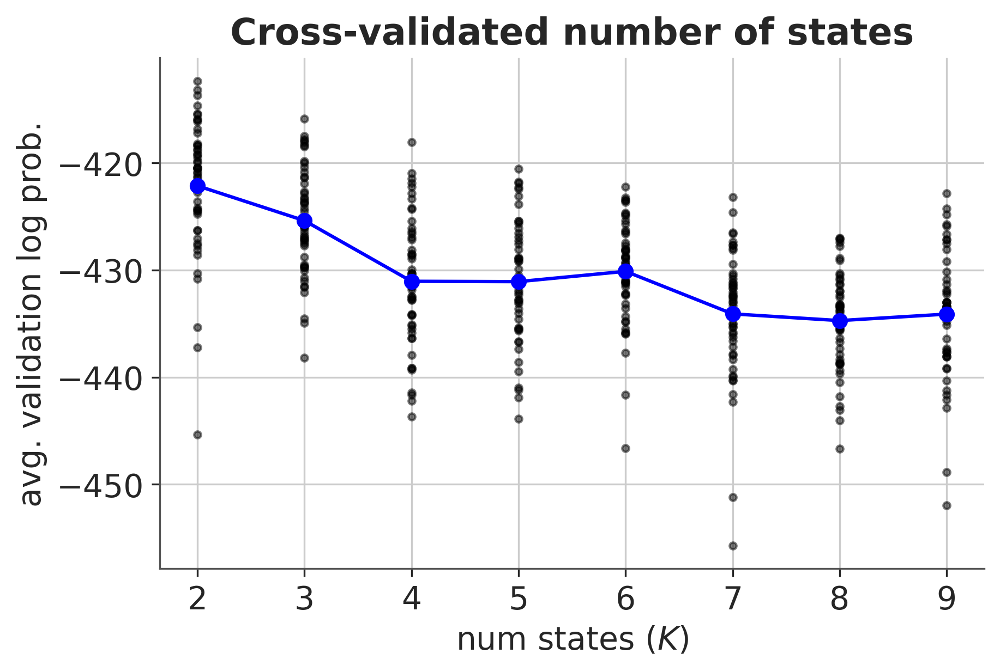

In [22]:
plt.figure(figsize=(6,4))
for k, per_fold_val_lls in zip(all_num_states, all_val_lls):
    plt.plot(k * jnp.ones_like(per_fold_val_lls), per_fold_val_lls, '.k', alpha=0.5)
plt.plot(all_num_states, avg_val_lls, '-bo')
plt.xlabel("num states ($K$)")
plt.ylabel("avg. validation log prob.")
plt.title("Cross-validated number of states")

### Full fit

In [23]:
# Initialize the parameters using K-Means on the full training set
key = jr.PRNGKey(0)
t_hmm = GaussianHMM(num_states=2, emission_dim=2, transition_matrix_stickiness=10.)
params, props = t_hmm.initialize(key=key, method="kmeans", emissions=train_emissions)
# params, lps = t_hmm.fit_em(params, props, train_emissions, num_iters=100)
params, lps = t_hmm.fit_sgd(
    params, props, train_emissions,
    num_epochs = 100, 
    optimizer = optax.adam(1e-4), 
    shuffle = True, 
    batch_size = 8,
)

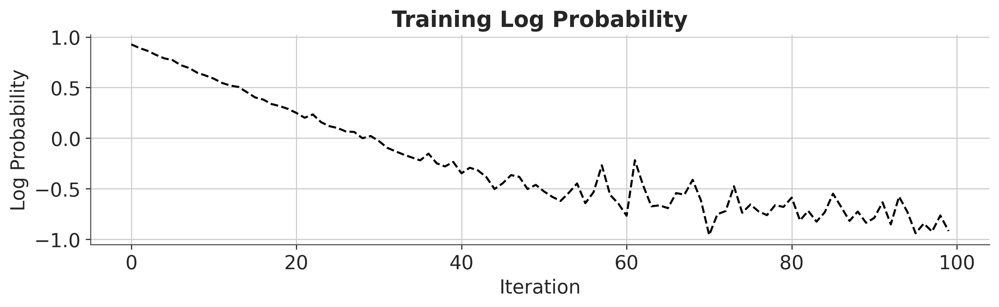

In [24]:
plt.figure(figsize=(10, 3))
plt.plot(lps, "k--")
plt.xlabel("Iteration")
plt.ylabel("Log Probability")
plt.title("Training Log Probability")
plt.show()

In [25]:
params

ParamsGaussianHMM(initial=ParamsStandardHMMInitialState(probs=Array([0.9924407 , 0.00755927], dtype=float32)), transitions=ParamsStandardHMMTransitions(transition_matrix=Array([[0.9951756 , 0.00482432],
       [0.00714789, 0.99285203]], dtype=float32)), emissions=ParamsGaussianHMMEmissions(means=Array([[0.08932231, 0.34375992],
       [0.7058398 , 0.1880143 ]], dtype=float32), covs=Array([[[ 0.00182346,  0.00135854],
        [ 0.00135854,  0.03131085]],

       [[ 0.0662549 , -0.01057505],
        [-0.01057505,  0.03602601]]], dtype=float32)))

In [26]:
mlstates = []

for train_emission in tqdm(train_emissions):
    most_likely_states = t_hmm.most_likely_states(params, train_emission)
    mlstates.append(most_likely_states)

mlstates = np.array(mlstates)

100%|██████████| 2880/2880 [00:46<00:00, 61.93it/s]


In [27]:
np.save("mlstates.npy", mlstates)

### State analysis

In [28]:
mlstates.shape

(2880, 239)

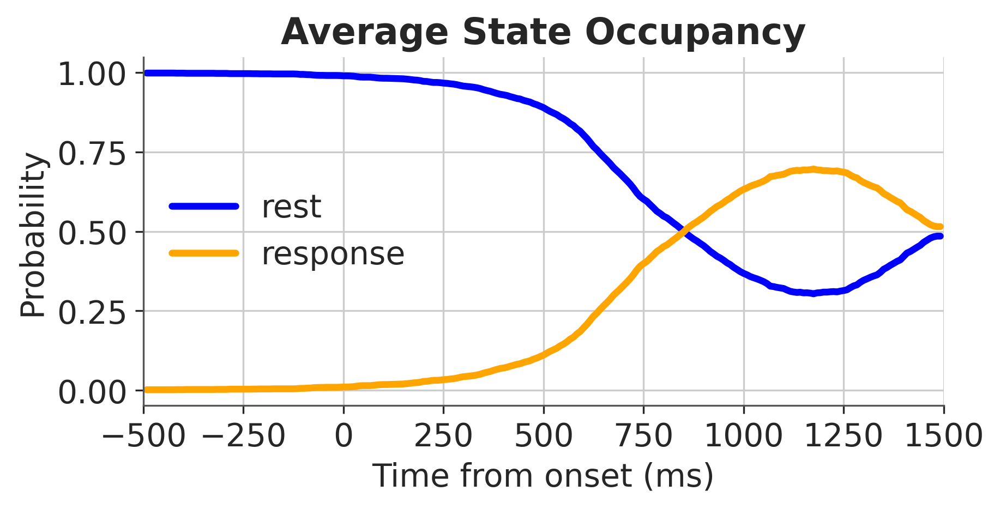

In [29]:
# Calculate probabilities
time_points = 239
state_probs = {state: np.mean(mlstates == state, axis=0) for state in [0, 1]}
state_colors = {0: "blue", 1: "orange"}
state_names = {0: "rest", 1: "response"}
# Plot probabilities
plt.figure(figsize=(6, 3))
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=state_names[state], linewidth=3, color=state_colors[state])
# plt.ylim(0, 1)
plt.xlim(-500, 1500)

plt.title('Average State Occupancy')
plt.xlabel('Time from onset (ms)')
plt.ylabel('Probability')
plt.legend()
plt.grid(True)
plt.show()


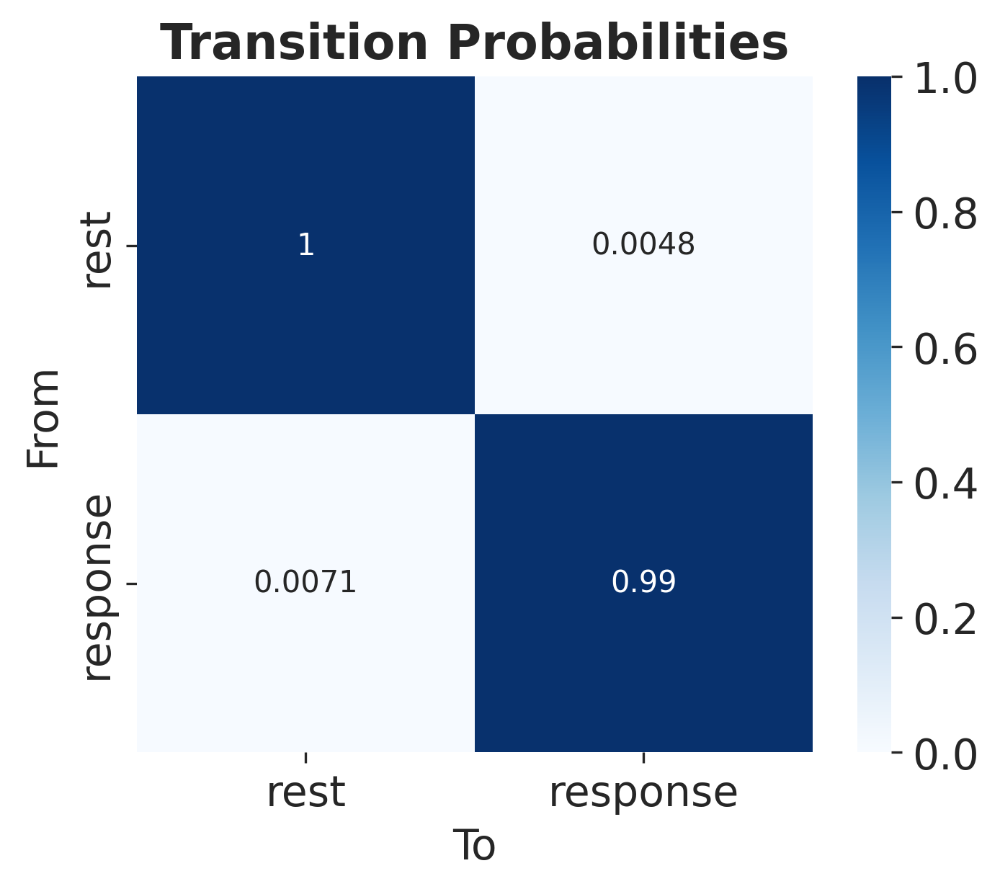

In [30]:
# params.transitions.transition_matrix

# plot the transition matrix sns 
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
sns.heatmap(params.transitions.transition_matrix, annot=True, ax=ax, cmap="Blues", cbar=True, square=True, vmax=1, vmin=0)
ax.set_title("Transition Probabilities")
ax.set_xlabel("To")
ax.set_ylabel("From")

# rename the ticks as 0 = rest, 1 = response
ax.set_xticklabels(["rest", "response"])
ax.set_yticklabels(["rest", "response"])

plt.show()

In [31]:
params.emissions.means

Array([[0.08932231, 0.34375992],
       [0.7058398 , 0.1880143 ]], dtype=float32)

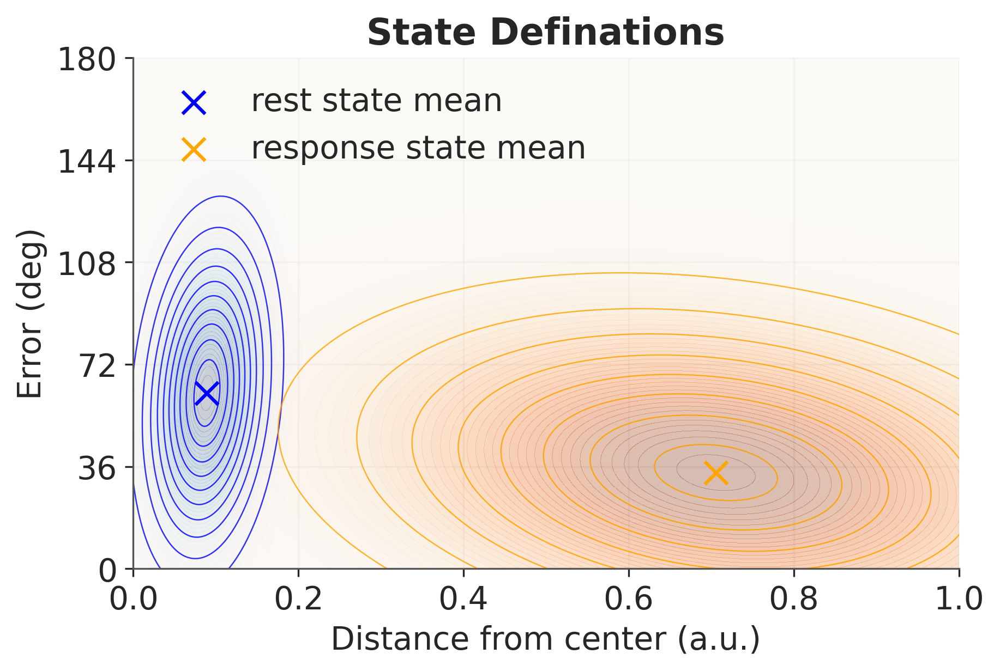

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

# Data: Means and Covariances
means = params.emissions.means
covs = params.emissions.covs

# Generate a grid for plotting
x, y = np.linspace(-0.2, 1.2, 500), np.linspace(-0.2, 1.2, 500)
X, Y = np.meshgrid(x, y)
pos = np.dstack((X, Y))

# Compute Gaussian densities
rv1 = multivariate_normal(mean=means[0], cov=covs[0])
rv2 = multivariate_normal(mean=means[1], cov=covs[1])
Z1 = rv1.pdf(pos)
Z2 = rv2.pdf(pos)

# Plot the combined view
plt.figure(figsize=(6, 4))

# Heatmaps
plt.contourf(X, Y, Z1, levels=50, cmap="Blues", alpha=0.3)
plt.contourf(X, Y, Z2, levels=50, cmap="Oranges", alpha=0.3)

# Contour lines
plt.contour(X, Y, Z1, levels=10, colors='blue', linewidths=.6, alpha=0.8)
plt.contour(X, Y, Z2, levels=10, colors='orange', linewidths=.6, alpha=0.8)

# Scatter points for means
# Scatter points for means with distinct labels
plt.scatter(means[0, 0], means[0, 1], c='blue', s=100, marker="x", label='rest state mean')
plt.scatter(means[1, 0], means[1, 1], c='orange', s=100, marker="x", label='response state mean')
# Labels and legend
plt.title("State Definations")
plt.xlabel("Distance from center (a.u.)")
plt.ylabel("Error (deg)")
plt.legend(loc="upper left")
plt.grid(alpha=0.3)

# multiply all the yticks with 180
plt.yticks(plt.yticks()[0], [f"{int(y*180)}" for y in plt.yticks()[0]])

# plt.colorbar(plt.cm.ScalarMappable(cmap='Blues'), label="Density State 1")
# plt.colorbar(plt.cm.ScalarMappable(cmap='Oranges'), label="Density State 2")

plt.ylim(0,1)
plt.xlim(0,1)
# plt.tight_layout()

plt.show()

In [33]:
params.emissions.covs

Array([[[ 0.00182346,  0.00135854],
        [ 0.00135854,  0.03131085]],

       [[ 0.0662549 , -0.01057505],
        [-0.01057505,  0.03602601]]], dtype=float32)

## Splitting by factors

In [34]:
mlstates

array([[0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 1, 1],
       ...,
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1]], dtype=int32)

In [35]:
mlstates.shape

(2880, 239)

In [36]:
subj_10_subset = r_table[r_table["subj"] == 10].copy()

In [37]:
subj_10_subset.reset_index(drop=True, inplace=True)
subj_10_subset

,subj,sess,run,trial,target,t_calib,resp,resp_err,v_err,exp,nn,1sig,2sig,nn_c,att,coh,exp_al,f_onset,f_resp,dir
0,10,0,0,0,159.0,149.509150,150.635667,1.126516,1.126516,149.50915,149.509150,1.0,1.0,1.0,-1,-1,1.0,192,430,higher
1,10,0,0,1,159.0,149.509150,151.155723,1.646573,1.646573,149.50915,149.509150,1.0,1.0,1.0,-1,-1,1.0,168,454,higher
2,10,0,0,2,159.0,149.509150,162.827417,13.318267,13.318267,149.50915,149.509150,0.0,1.0,1.0,1,1,1.0,132,415,higher
3,10,0,0,3,51.0,26.748492,26.089714,0.658778,-0.658778,149.50915,26.748492,1.0,1.0,1.0,1,-1,0.0,168,379,lower
4,10,0,0,4,159.0,149.509150,160.367169,10.858018,10.858018,149.50915,149.509150,0.0,1.0,1.0,1,1,1.0,168,308,higher
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,10,3,5,115,15.0,4.930406,21.430539,16.500134,16.500134,NaN,26.748492,0.0,0.0,0.0,-1,1,NaN,156,340,higher
2876,10,3,5,116,15.0,4.930406,21.505307,16.574901,16.574901,NaN,26.748492,0.0,0.0,0.0,1,-1,NaN,180,395,higher
2877,10,3,5,117,159.0,149.509150,134.060377,15.448773,-15.448773,NaN,131.780960,0.0,1.0,0.0,1,1,NaN,192,394,lower
2878,10,3,5,118,51.0,26.748492,33.951472,7.202980,7.202980,NaN,26.748492,1.0,1.0,1.0,-1,-1,NaN,132,424,higher


In [38]:
def adjust_color_hls(color, factor=1.0):
    """
    Lighten or darken a color while maintaining its hue and saturation.
    Args:
        color (str or tuple): Base color in any Matplotlib-compatible format.
        factor (float): Factor by which to adjust the lightness. >1 darkens, <1 lightens.
    Returns:
        tuple: Adjusted color in RGBA format.
    """
    # Convert the color to RGB and then to HLS
    rgb = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(*rgb)
    
    # Adjust the lightness
    l = max(0, min(1, l * factor))
    
    # Convert back to RGB
    adjusted_rgb = colorsys.hls_to_rgb(h, l, s)
    return adjusted_rgb

# Example usage
light_orange = adjust_color_hls("orange", factor=1.4)  # Lighter orange
dark_orange = adjust_color_hls("orange", factor=1)   # Darker orange

light_blue = adjust_color_hls("blue", factor=1.4)  # Lighter blue
dark_blue = adjust_color_hls("blue", factor=1)   # Darker blue

light_cols = [light_blue, light_orange]
dark_cols = [dark_blue, dark_orange]

## Most Likely State Sequences

### Coherance split

In [39]:
low_coherance_mask = subj_10_subset["coh"] == -1
high_coherance_mask = subj_10_subset["coh"] == 1

In [40]:
low_coh_states = mlstates[low_coherance_mask]
high_coh_states = mlstates[high_coherance_mask]

In [41]:
low_coh_states.shape, high_coh_states.shape

((1440, 239), (1440, 239))

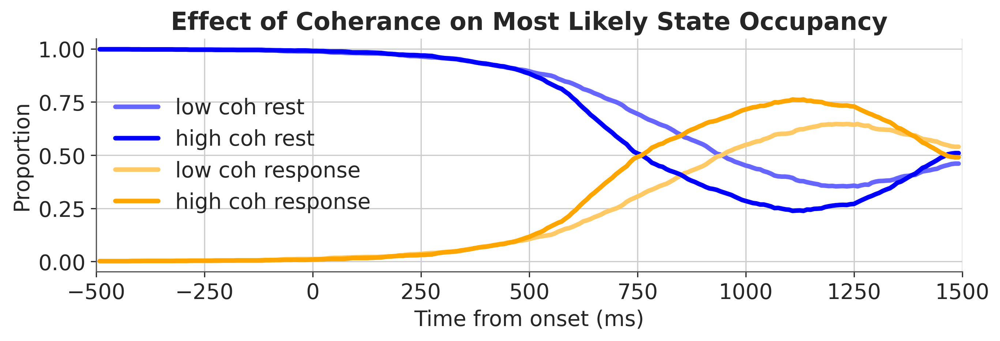

In [42]:
# Calculate probabilities
state_names = {0: "rest", 1: "response"}

# Plot probabilities
plt.figure(figsize=(9, 3))

state_probs = {state: np.mean(low_coh_states == state, axis=0) for state in [0, 1]}
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=["low coh rest", "low coh response"][state], linewidth=3, color=light_cols[state])

state_probs = {state: np.mean(high_coh_states == state, axis=0) for state in [0, 1]}
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=["high coh rest", "high coh response"][state], linewidth=3, color=dark_cols[state])


# plt.ylim(0, 1)
plt.xlim(-500, 1500)

plt.title('Effect of Coherance on Most Likely State Occupancy')
plt.xlabel('Time from onset (ms)')
plt.ylabel('Proportion')
plt.legend()

handles, labels = plt.gca().get_legend_handles_labels()
order = [0,2,1,3]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

plt.grid(True)
plt.show()


### Attention split

In [43]:
low_att_mask = subj_10_subset["att"] == -1
high_att_mask = subj_10_subset["att"] == 1

In [44]:
low_att_states = mlstates[low_att_mask]
high_att_states = mlstates[high_att_mask]

low_att_states.shape, high_att_states.shape

((1440, 239), (1440, 239))

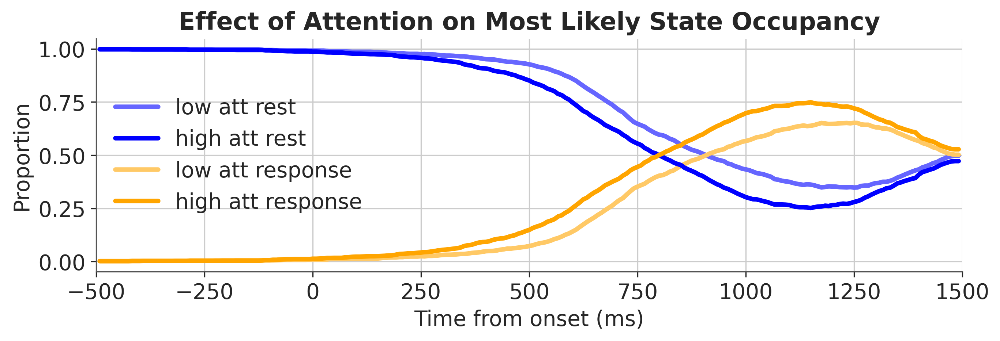

In [45]:
# Plot probabilities
plt.figure(figsize=(9, 3))

state_probs = {state: np.mean(low_att_states == state, axis=0) for state in [0, 1]}
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=["low att rest", "low att response"][state], linewidth=3, color=light_cols[state])

state_probs = {state: np.mean(high_att_states == state, axis=0) for state in [0, 1]}
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=["high att rest", "high att response"][state], linewidth=3, color=dark_cols[state])


# plt.ylim(0, 1)
plt.xlim(-500, 1500)

plt.title('Effect of Attention on Most Likely State Occupancy')
plt.xlabel('Time from onset (ms)')
plt.ylabel('Proportion')
plt.legend()

handles, labels = plt.gca().get_legend_handles_labels()
order = [0,2,1,3]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

plt.grid(True)
plt.show()

### Expectation split

In [46]:
unexpected_mask = subj_10_subset["exp_al"] == 0
expected_mask = subj_10_subset["exp_al"] == 1

In [47]:
unexpected_states = mlstates[unexpected_mask]
expected_states = mlstates[expected_mask]

unexpected_states.shape, expected_states.shape

((640, 239), (1760, 239))

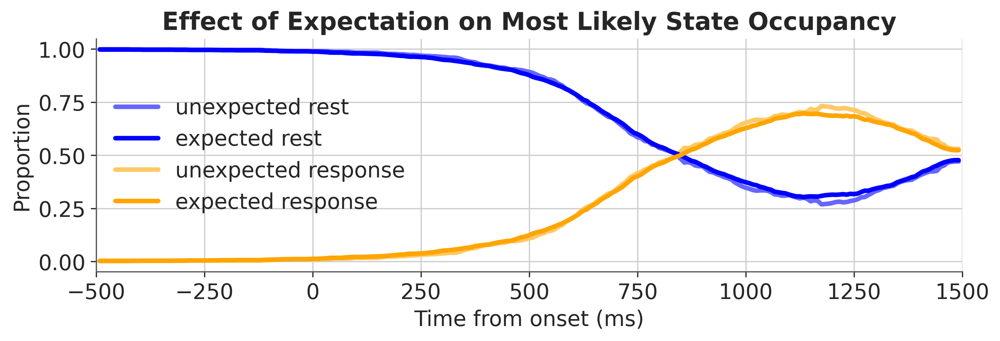

In [48]:
# Plot probabilities
plt.figure(figsize=(9, 3))

state_probs = {state: np.mean(unexpected_states == state, axis=0) for state in [0, 1]}
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=["unexpected rest", "unexpected response"][state], linewidth=3, color=light_cols[state])

state_probs = {state: np.mean(expected_states == state, axis=0) for state in [0, 1]}
for state, probs in state_probs.items():
    plt.plot(mini_axis, probs, label=["expected rest", "expected response"][state], linewidth=3, color=dark_cols[state])


# plt.ylim(0, 1)
plt.xlim(-500, 1500)

plt.title('Effect of Expectation on Most Likely State Occupancy')
plt.xlabel('Time from onset (ms)')
plt.ylabel('Proportion')
plt.legend()

handles, labels = plt.gca().get_legend_handles_labels()
order = [0,2,1,3]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

plt.grid(True)
plt.show()

## Posterior state probabilities

In [49]:
post_states = []

for train_emission in tqdm(train_emissions):
    post = t_hmm.smoother(params, train_emission)
    post_states.append(post)

100%|██████████| 2880/2880 [00:45<00:00, 63.77it/s]


In [50]:
all_mlls = []
all_smoothed_probs = []

for post_state in post_states:
    all_mlls.append(post_state.marginal_loglik)
    all_smoothed_probs.append(post_state.smoothed_probs)

all_mlls = np.array(all_mlls)
all_smoothed_probs = np.array(all_smoothed_probs)

In [51]:
all_mlls.shape, all_smoothed_probs.shape

((2880,), (2880, 239, 2))

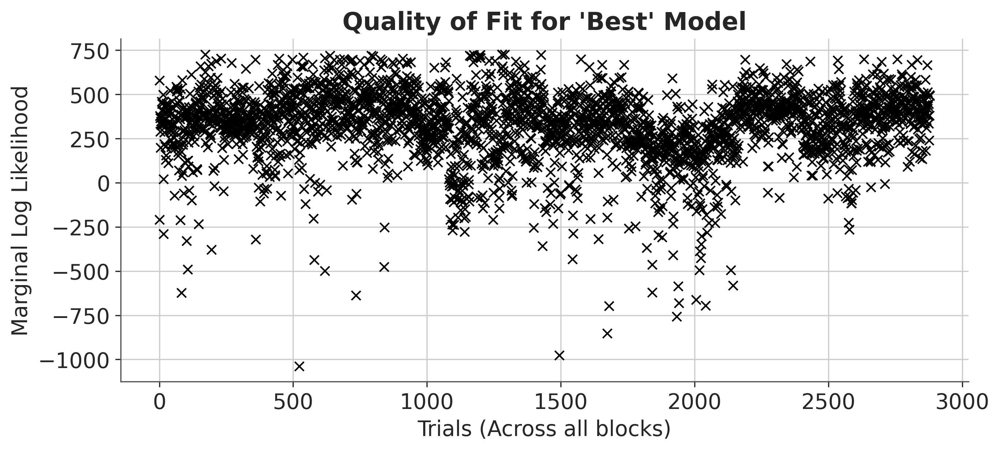

In [52]:
# plot the mlls
plt.figure(figsize=(9, 4))
plt.plot(all_mlls, "xk")
plt.xlabel("Trials (Across all blocks)")
plt.ylabel("Marginal Log Likelihood")
plt.title("Quality of Fit for 'Best' Model")
plt.show()

In [53]:
rest_probs = all_smoothed_probs[:, :, 0]
response_probs = all_smoothed_probs[:, :, 1]

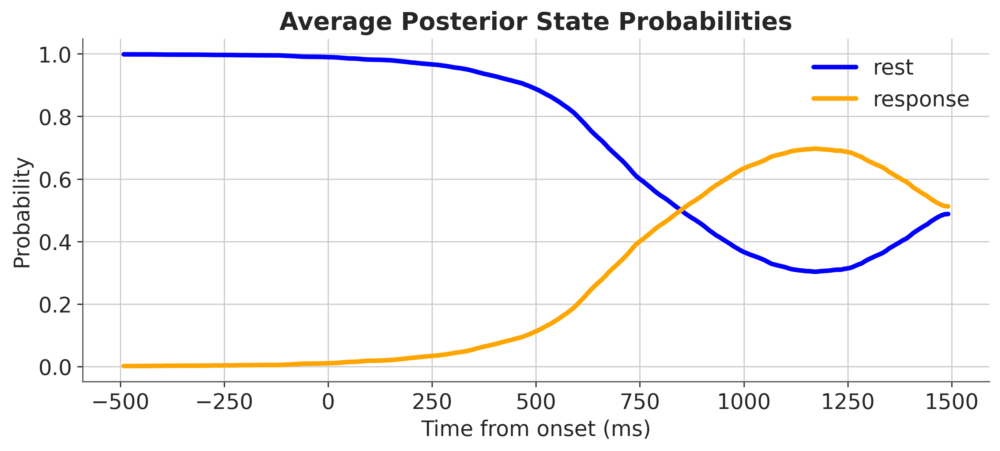

In [54]:
# Plot the average posterior probabilities for the 2 states

plt.figure(figsize=(9, 4))
plt.plot(mini_axis, rest_probs.mean(axis=0), label="rest", color="blue", linewidth=3)
plt.plot(mini_axis, response_probs.mean(axis=0), label="response", color="orange", linewidth=3)
plt.xlabel("Time from onset (ms)")
plt.ylabel("Probability")
plt.title("Average Posterior State Probabilities")
plt.legend()
plt.grid(True)
plt.show()


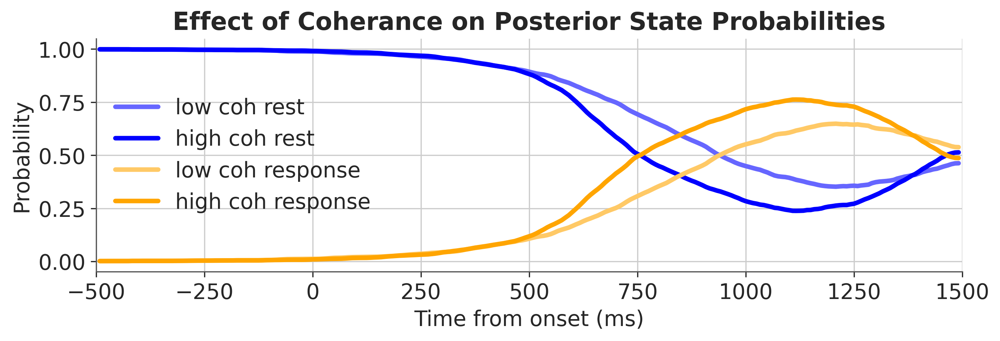

In [55]:
low_coherance_mask = subj_10_subset["coh"] == -1
high_coherance_mask = subj_10_subset["coh"] == 1

low_coh_rest = rest_probs[low_coherance_mask]
low_coh_response = response_probs[low_coherance_mask]

high_coh_rest = rest_probs[high_coherance_mask]
high_coh_response = response_probs[high_coherance_mask]

plt.figure(figsize=(9, 3))
plt.plot(mini_axis, low_coh_rest.mean(axis=0), label="low coh rest", color=light_blue, linewidth=3)
plt.plot(mini_axis, high_coh_rest.mean(axis=0), label="high coh rest", color=dark_blue, linewidth=3)
plt.plot(mini_axis, low_coh_response.mean(axis=0), label="low coh response", color=light_orange, linewidth=3)
plt.plot(mini_axis, high_coh_response.mean(axis=0), label="high coh response", color=dark_orange, linewidth=3)
plt.xlabel("Time from onset (ms)")
plt.ylabel("Probability")
plt.title("Effect of Coherance on Posterior State Probabilities")
plt.legend()
plt.grid(True)

plt.xlim(-500, 1500)

plt.show()


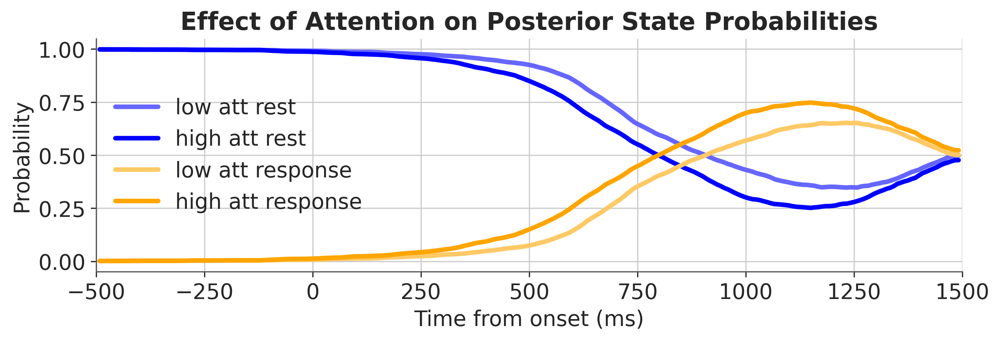

In [56]:
low_attention_mask = subj_10_subset["att"] == -1
high_attention_mask = subj_10_subset["att"] == 1

low_att_rest = rest_probs[low_attention_mask]
low_att_response = response_probs[low_attention_mask]

high_att_rest = rest_probs[high_attention_mask]
high_att_response = response_probs[high_attention_mask]

plt.figure(figsize=(9, 3))
plt.plot(mini_axis, low_att_rest.mean(axis=0), label="low att rest", color=light_blue, linewidth=3)
plt.plot(mini_axis, high_att_rest.mean(axis=0), label="high att rest", color=dark_blue, linewidth=3)
plt.plot(mini_axis, low_att_response.mean(axis=0), label="low att response", color=light_orange, linewidth=3)
plt.plot(mini_axis, high_att_response.mean(axis=0), label="high att response", color=dark_orange, linewidth=3)
plt.xlabel("Time from onset (ms)")
plt.ylabel("Probability")
plt.title("Effect of Attention on Posterior State Probabilities")
plt.legend()
plt.grid(True)

plt.xlim(-500, 1500)

plt.show()


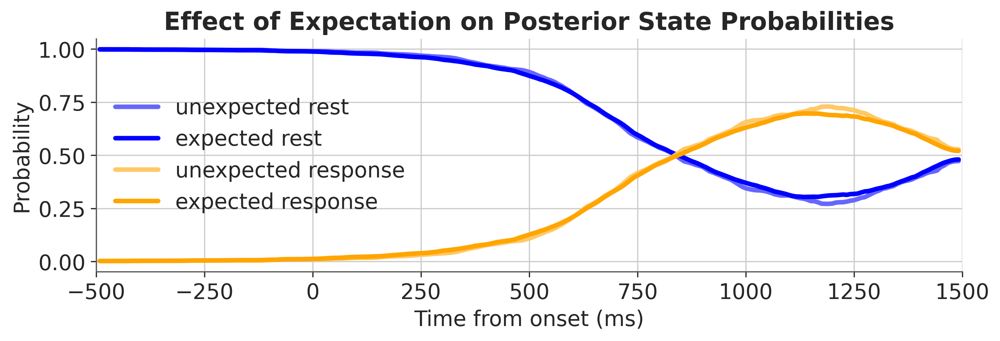

In [57]:
unexpected_mask = subj_10_subset["exp_al"] == 0
expected_mask = subj_10_subset["exp_al"] == 1

unexpected_rest = rest_probs[unexpected_mask]
unexpected_response = response_probs[unexpected_mask]

expected_rest = rest_probs[expected_mask]
expected_response = response_probs[expected_mask]

plt.figure(figsize=(9, 3))
plt.plot(mini_axis, unexpected_rest.mean(axis=0), label="unexpected rest", color=light_blue, linewidth=3)
plt.plot(mini_axis, expected_rest.mean(axis=0), label="expected rest", color=dark_blue, linewidth=3)
plt.plot(mini_axis, unexpected_response.mean(axis=0), label="unexpected response", color=light_orange, linewidth=3)
plt.plot(mini_axis, expected_response.mean(axis=0), label="expected response", color=dark_orange, linewidth=3)
plt.xlabel("Time from onset (ms)")
plt.ylabel("Probability")
plt.title("Effect of Expectation on Posterior State Probabilities")
plt.legend()
plt.grid(True)

plt.xlim(-500, 1500)

plt.show()


## State Space Dim reduction

### Exploring all dim reds

In [58]:
# import tsne
from sklearn.manifold import TSNE


In [59]:
mlstates.shape

(2880, 239)

In [60]:
# reduce the dimensionality of the states
tsne = TSNE(n_components=2, random_state=42)
tsne_states = tsne.fit_transform(mlstates)

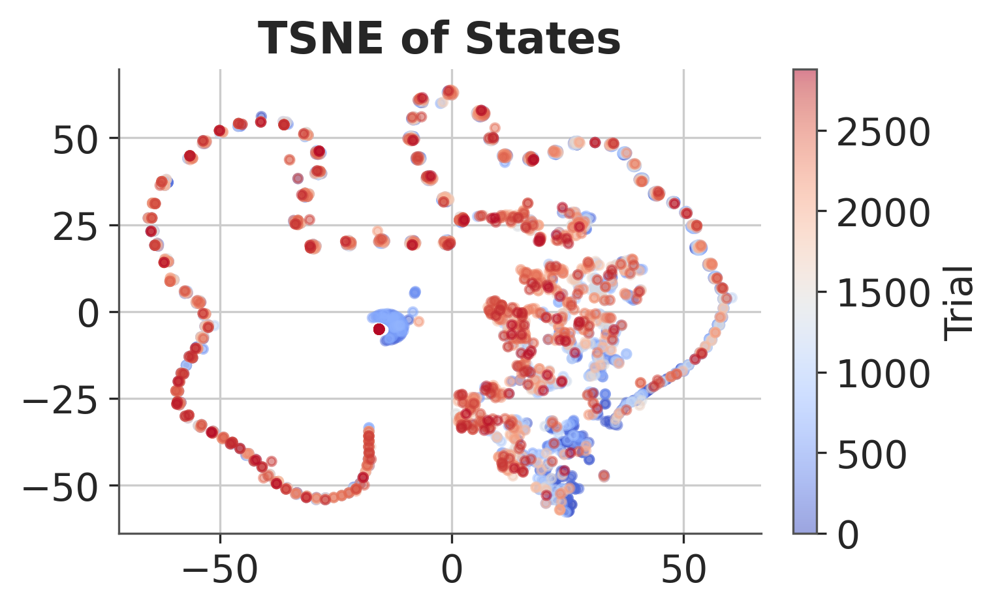

In [61]:
# visaualize the states
plt.figure(figsize=(5, 3))
plt.scatter(tsne_states[:, 0], tsne_states[:, 1], c=np.arange(len(tsne_states)), cmap="coolwarm", s=10, alpha=0.5)
plt.colorbar(). set_label("Trial")
plt.title("TSNE of States")
plt.show()


In [62]:
# Now do pca
from sklearn.decomposition import PCA

In [63]:
pca = PCA(n_components=2)
pca_states = pca.fit_transform(mlstates)

pca_states.shape

(2880, 2)

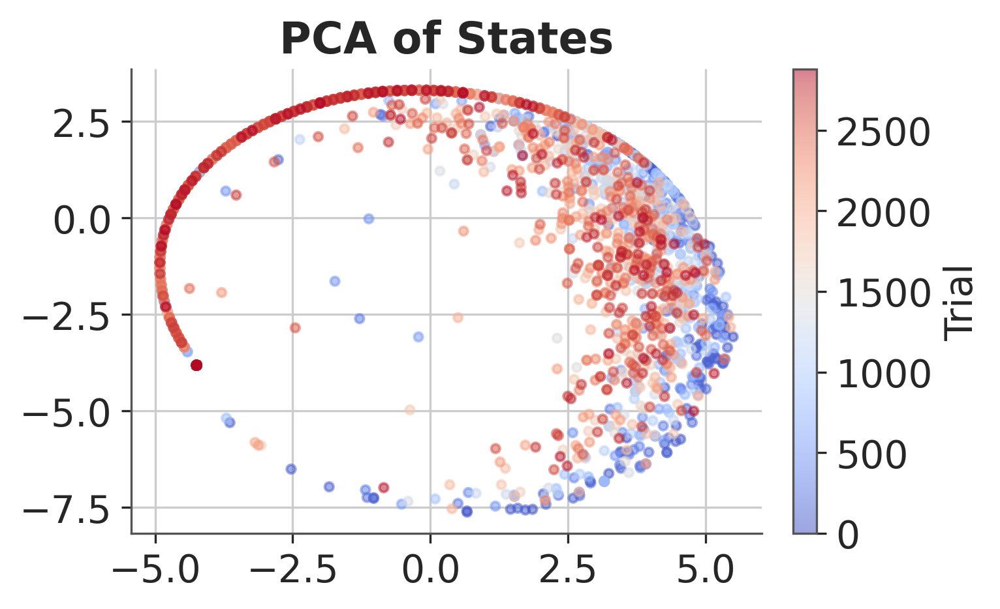

In [64]:
plt.figure(figsize=(5, 3))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=np.arange(len(pca_states)), cmap="coolwarm", s=10, alpha=0.5)
# label the cbar
plt.colorbar().set_label("Trial")
plt.title("PCA of States")
plt.show()

In [65]:
import phate
import scprep

In [66]:
phate_operator = phate.PHATE(n_components = 2, n_jobs=-2)

In [67]:
Y_phate = phate_operator.fit_transform(mlstates)

Calculating PHATE...
  Running PHATE on 2880 observations and 239 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.66 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 0.93 seconds.
  Calculating landmark operator...
    Calculating SVD...


/home/nuttidalab/miniconda3/envs/ssm/lib/python3.9/site-packages/graphtools/graphs.py:290: RuntimeWarning: Detected zero distance between 8810 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
/home/nuttidalab/miniconda3/envs/ssm/lib/python3.9/site-packages/graphtools/graphs.py:454: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


    Calculated SVD in 0.22 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.12 seconds.
  Calculated landmark operator in 1.47 seconds.
  Calculating optimal t...
    Automatically selected t = 20
  Calculated optimal t in 0.19 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.03 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.43 seconds.
Calculated PHATE in 3.06 seconds.


In [68]:
c = np.arange(len(Y_phate))

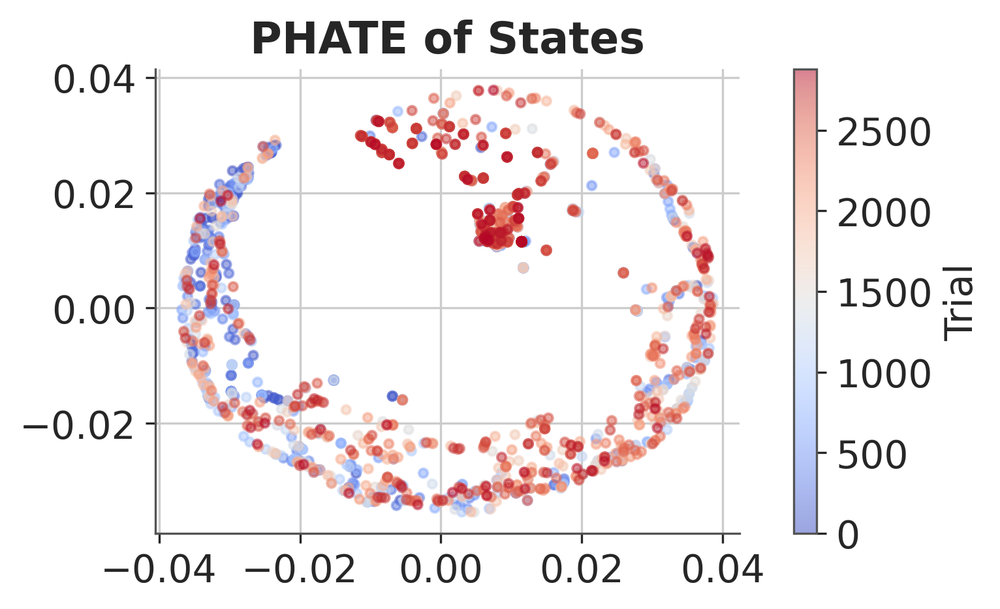

In [69]:
plt.figure(figsize=(5, 3))
plt.scatter(Y_phate[:, 0], Y_phate[:, 1], c=np.arange(len(Y_phate)), cmap="coolwarm", s=10, alpha=0.5)
# label the cbar
plt.colorbar().set_label("Trial")
plt.title("PHATE of States")
plt.show()

Calculating PHATE...
  Running PHATE on 239 observations and 2880 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.51 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 0.56 seconds.
  Calculating optimal t...
    Automatically selected t = 20
  Calculated optimal t in 0.03 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...
  Calculated metric MDS in 0.06 seconds.
Calculated PHATE in 0.66 seconds.


/home/nuttidalab/miniconda3/envs/ssm/lib/python3.9/site-packages/graphtools/graphs.py:290: RuntimeWarning: Detected zero distance between 142 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
/home/nuttidalab/miniconda3/envs/ssm/lib/python3.9/site-packages/graphtools/graphs.py:454: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


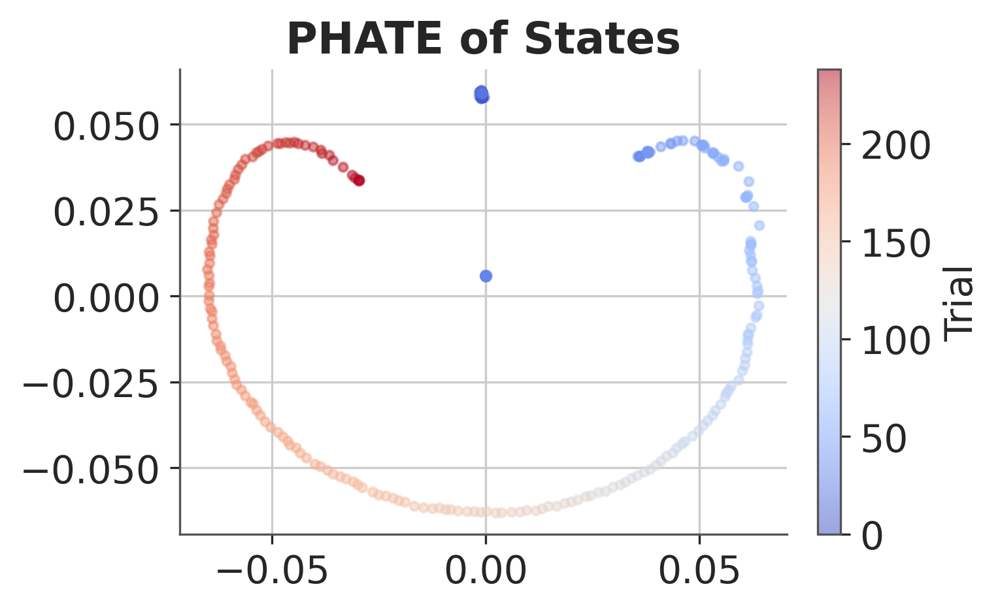

In [70]:
Y_phate = phate_operator.fit_transform(mlstates.T)

plt.figure(figsize=(5, 3))
plt.scatter(Y_phate[:, 0], Y_phate[:, 1], c=np.arange(len(Y_phate)), cmap="coolwarm", s=10, alpha=0.5)
# label the cbar
plt.colorbar().set_label("Trial")
plt.title("PHATE of States")
plt.show()

### Deep into pca

In [71]:
# pca
pca = PCA(n_components=2)
pca_states = pca.fit_transform(mlstates)

In [72]:
pca_states.shape

(2880, 2)

In [73]:
subj_10_subset

,subj,sess,run,trial,target,t_calib,resp,resp_err,v_err,exp,nn,1sig,2sig,nn_c,att,coh,exp_al,f_onset,f_resp,dir
0,10,0,0,0,159.0,149.509150,150.635667,1.126516,1.126516,149.50915,149.509150,1.0,1.0,1.0,-1,-1,1.0,192,430,higher
1,10,0,0,1,159.0,149.509150,151.155723,1.646573,1.646573,149.50915,149.509150,1.0,1.0,1.0,-1,-1,1.0,168,454,higher
2,10,0,0,2,159.0,149.509150,162.827417,13.318267,13.318267,149.50915,149.509150,0.0,1.0,1.0,1,1,1.0,132,415,higher
3,10,0,0,3,51.0,26.748492,26.089714,0.658778,-0.658778,149.50915,26.748492,1.0,1.0,1.0,1,-1,0.0,168,379,lower
4,10,0,0,4,159.0,149.509150,160.367169,10.858018,10.858018,149.50915,149.509150,0.0,1.0,1.0,1,1,1.0,168,308,higher
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,10,3,5,115,15.0,4.930406,21.430539,16.500134,16.500134,NaN,26.748492,0.0,0.0,0.0,-1,1,NaN,156,340,higher
2876,10,3,5,116,15.0,4.930406,21.505307,16.574901,16.574901,NaN,26.748492,0.0,0.0,0.0,1,-1,NaN,180,395,higher
2877,10,3,5,117,159.0,149.509150,134.060377,15.448773,-15.448773,NaN,131.780960,0.0,1.0,0.0,1,1,NaN,192,394,lower
2878,10,3,5,118,51.0,26.748492,33.951472,7.202980,7.202980,NaN,26.748492,1.0,1.0,1.0,-1,-1,NaN,132,424,higher


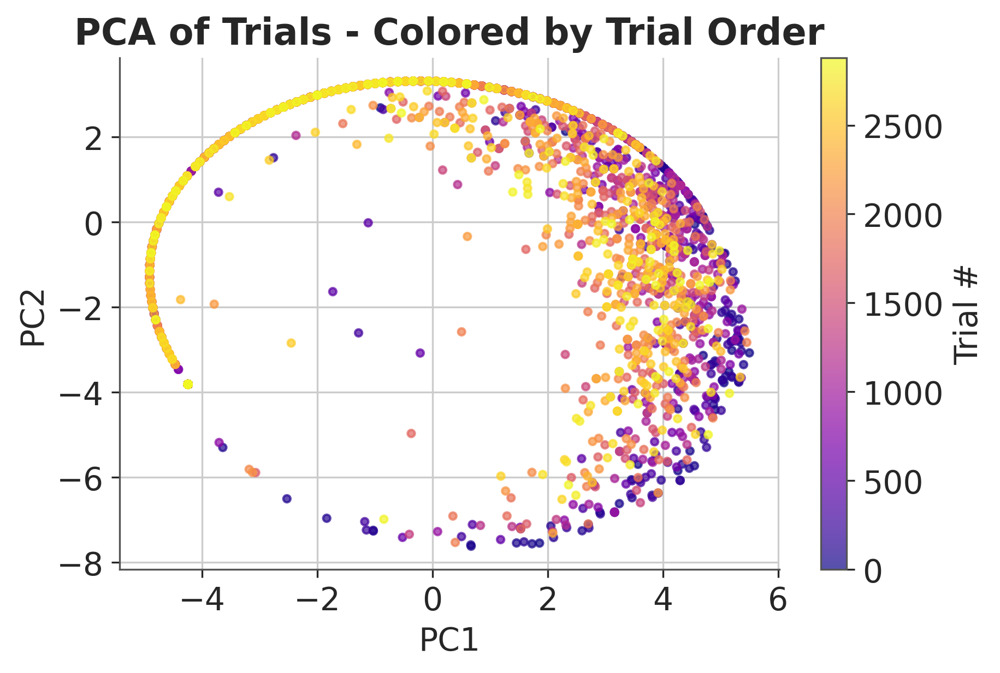

In [74]:
plt.figure(figsize=(6, 4))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=np.arange(len(pca_states)), cmap="plasma", s=10, alpha=0.7)
plt.colorbar().set_label("Trial #")
plt.title("PCA of Trials - Colored by Trial Order")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


/tmp/ipykernel_412037/4212711474.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


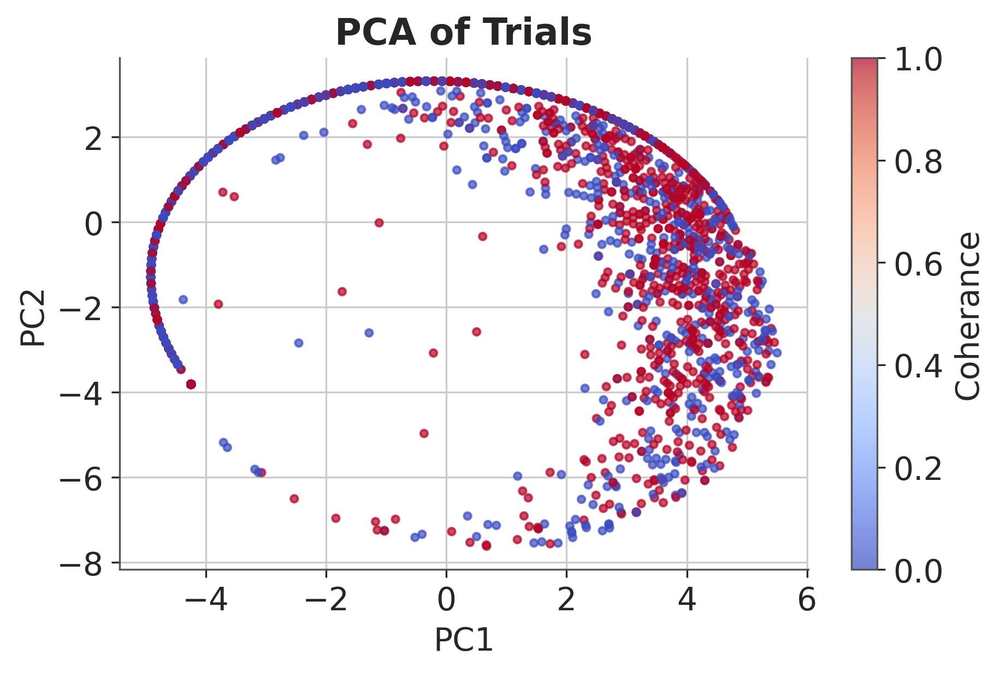

In [75]:
c = subj_10_subset["coh"] == 1

plt.figure(figsize=(6, 4))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=c, cmap="coolwarm", s=10, alpha=0.7)
plt.title("PCA of Trials")
plt.colorbar().set_label("Coherance")
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

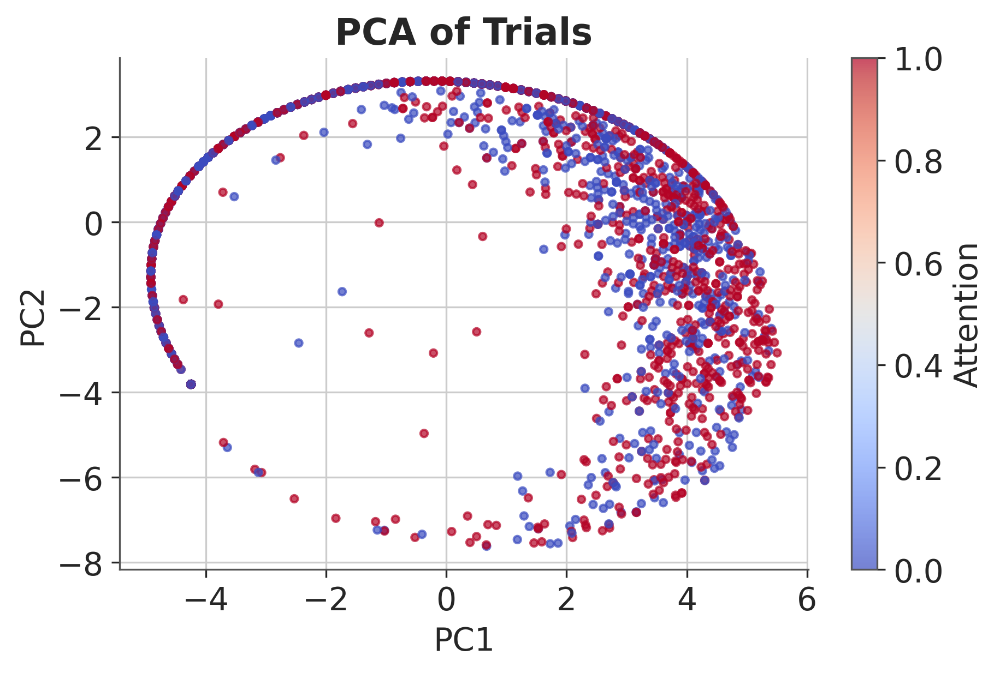

In [127]:
c = subj_10_subset["att"] == 1

plt.figure(figsize=(6, 4))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=c, cmap="coolwarm", s=10, alpha=0.7)
plt.title("PCA of Trials")
plt.colorbar().set_label("Attention")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

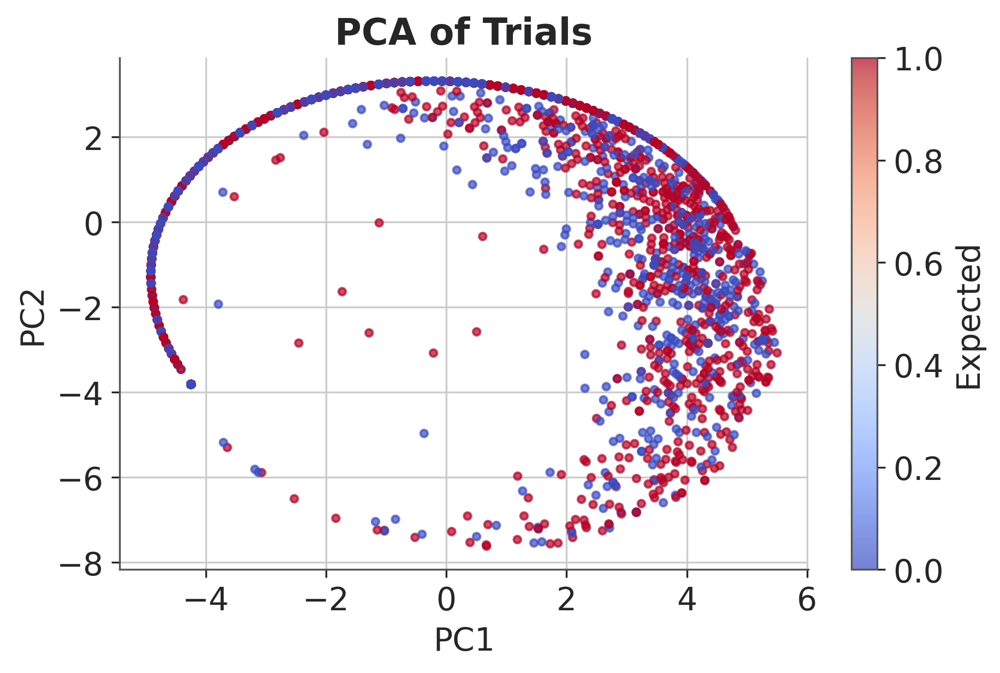

In [128]:
c = subj_10_subset["exp_al"] == 1

plt.figure(figsize=(6, 4))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=c, cmap="coolwarm", s=10, alpha=0.7)
plt.title("PCA of Trials")
plt.colorbar().set_label("Expected")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

/tmp/ipykernel_412037/3758578852.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


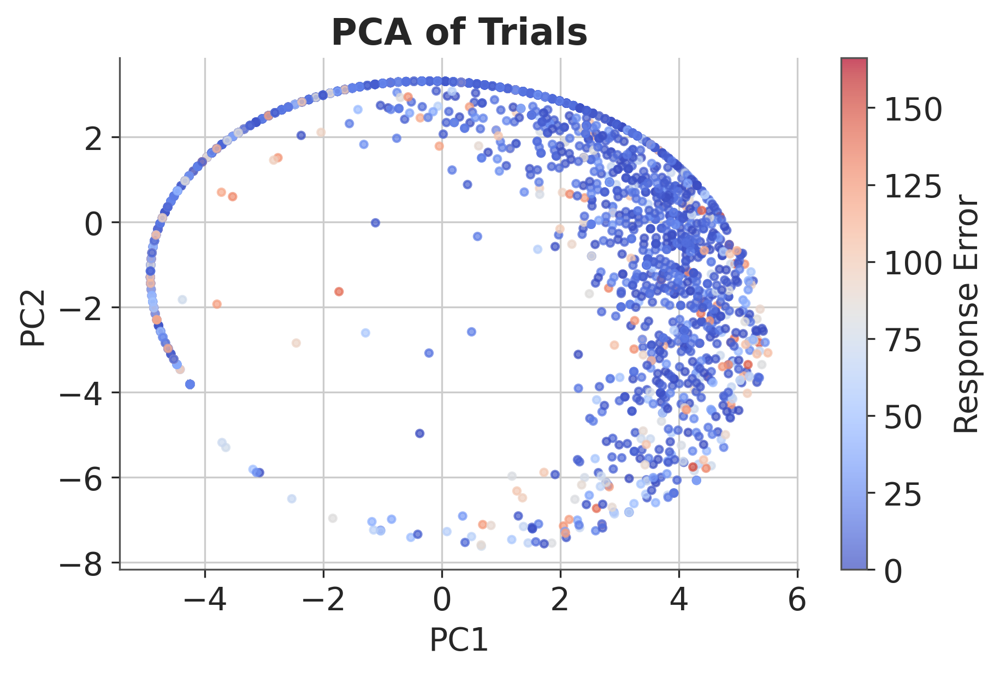

In [107]:
c = subj_10_subset["resp_err"].values

plt.figure(figsize=(6, 4))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=c, cmap="coolwarm", s=10, alpha=0.7)
plt.colorbar().set_label("Response Error")
plt.title("PCA of Trials")
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

/tmp/ipykernel_412037/737869982.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


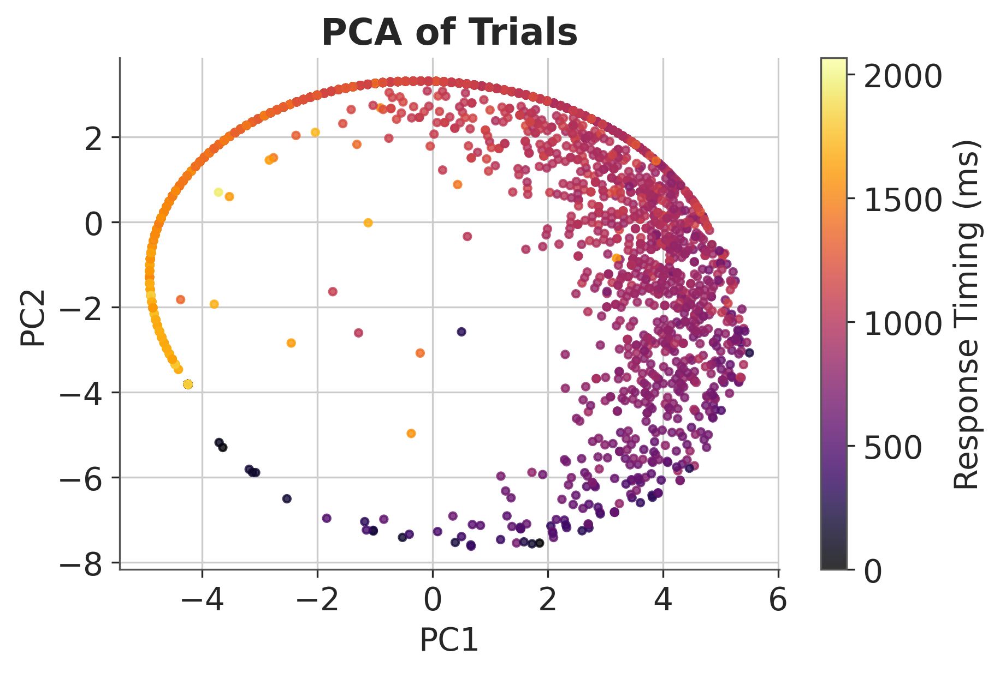

In [109]:
c = (subj_10_subset["f_resp"] - 250) * (1000/120)

plt.figure(figsize=(6, 4))
plt.scatter(pca_states[:, 0], pca_states[:, 1], c=c, cmap="inferno", s=10, alpha=.8)
plt.colorbar().set_label("Response Timing (ms)")
plt.title("PCA of Trials")
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

## Responsetime viz

In [101]:
r_time = (subj_10_subset["f_resp"] - 250)* (1000/120)

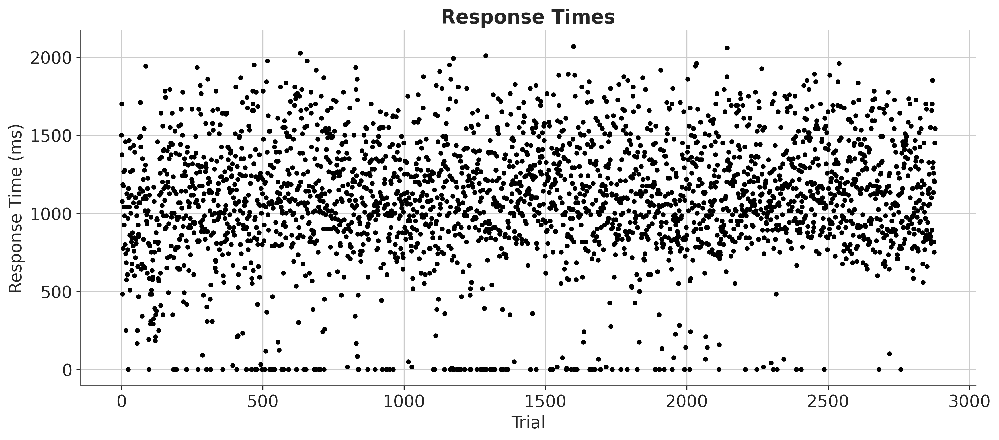

In [117]:
# plt.plot(r_time, "k.")
# put a polynomial fit on it
plt.plot(r_time, "k.")
plt.xlabel("Trial")
plt.ylabel("Response Time (ms)")
plt.title("Response Times")
plt.show()


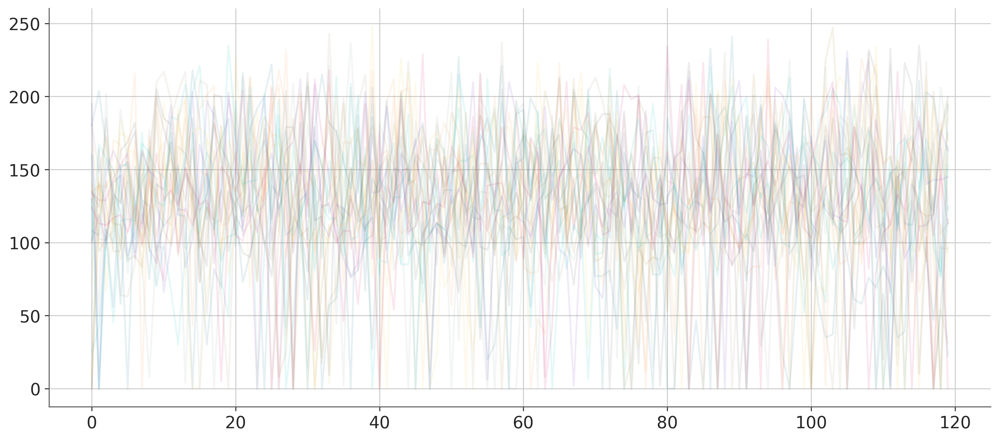

In [91]:
for line in r_time.values.reshape(-1, 120):
    plt.plot(line, "-", alpha=0.1)